<a href="https://colab.research.google.com/github/evmpython/minicurso_nowcasting_CPAM2024/blob/main/cpam_basico_satelite_2024.ipynb" target="_parent"><img src="https://colab.research.google.com/assets/colab-badge.svg" alt="Open In Colab"/></a>

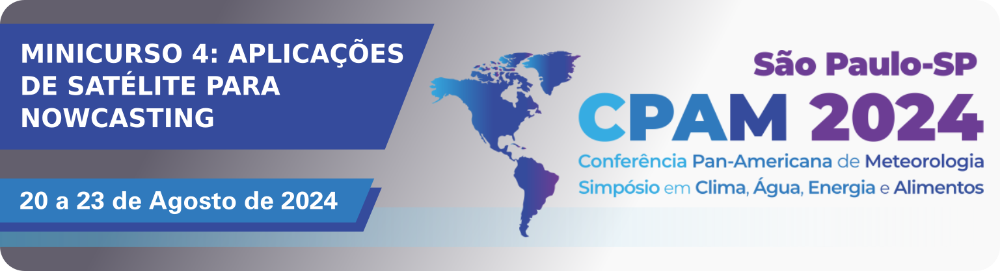

---
# Minicurso: **APLICAÇÕES DE SATÉLITE PARA NOWCASTING**
## Notebook Colab 1: **Dados ABI e GLM**
---

**OBJETIVO:** Esta primeira parte prática do curso tem como objetivo ensinar a utilização dos dados e produtos de satélite para monitoramento em tempo real e nowcasting (previsão dentro de um período de 0-6 horas).

---

**EMENTA**: Serão abordados os seguintes tópicos

1. Download dos dados do sensor ABI e GLM do GOES-16
2. Transformação da projeção satélite para retangular
3. Plotar imagens em escala de cinza
4. Plotar imagens em escala colorida
5. Gerar imagem do IR combinado com o total de flashes
6. Gerar imagem do IR combinado com a densidade de eventos
7. Rastreamento manual de tempestade e evolução temporal da temperatura de bilho do IR e flashes
---

**DADOS:**
- A parte prática do curso utilizará como informações de entrada os dados do sensor Advanced Baseline Imager (ABI) e Geostationary Lightning Mapper (GLM) abordo do satélite Geostationary Operational Environmental Satellite - 16 (GOES-16). O período de dados é referente aos desastres naturais que ocorreram no estado do Rio Grande do Sul entre 26 de abril e 5 de maio de 2024. O INMET registrou para o mês de Maio de 2024 um total de 617,1 mm, o que indicou uma chuva acima da média no valor de `480,5 mm`. Em adição, a estação pluviométrica do CEMADEN localizada em Santa Maria (RS) registrou `236 mm` no dia 30 de abril. Os desastres afetaram 2.398.255 pessoas e provocaram a morte de 182 pessoas.

- Maiores detalhes sobre o evento pode ser encontrado na Nota Técnica emitida pelo [INMET-Eventos Extremos de Março de 2024 no Brasil](https://github.com/evmpython/minicurso_nowcasting_CPAM2024/blob/main/docs/EventosExtremos-Brasil-Maio-2024.pdf) e [CEMADEN - Boletim de Impactos de Extremos de Origem Hidro-Geo-Climático em Atividades Estratégicas para o Brasil – 14/05/2024 ANO 07 Nº 66](https://www.gov.br/cemaden/pt-br/assuntos/monitoramento/boletim-de-impactos/copy4_of_boletim-de-impactos-de-extremos-de-origem-hidro-geo-climatico-em-atividades-estrategicas-para-o-brasil-2013-17-01-2024-ano-07-no-62).


---

**PROCEDIMENTO REALIZADO:** Os seguintes procedimentos serão realizados nesse código:
1. 1° Passo: Instalando bibliotecas
2. 2° Passo: Download de arquivos auxiliares
3. **Script 01** - Baixando Dados da Nuvem - AWS
4. **Script 02** - Projeção Retangular e Imagem em Níveis de Cinza
5. **Script 03** - Projeção Retangular com Imagem Colorida
6. **Script 04** - Imagem IR + Total de Flashes do GLM
7. **Script 05** - Imagem IR + Densidade de Eventos do GLM
8. **Script 06** - Evolução Temporal da Temperatura de Brilho do IR e Flashes
---

**OBSERVAÇÕES IMPORTANTES**:
1. Este código foi desenvolvido para ser processado no [Google Colaboratory](https://colab.research.google.com/).
2. Os dados e códigos do curso também estão disponíveis no [github do curso](https://github.com/evmpython/minicurso_nowcasting_CPAM2024).

---

**EQUIPE:**

Palestrantes/Tutores:
 - Diego Souza - INPE: diego.souza@inpe.br / https://github.com/diegormsouza
 - Enrique Vieira Mattos - UNIFEI: enrique@unifei.edu.br / https://github.com/evmpython
 - Rachel Albrecht - USP: rachel.albrecht@iag.usp.br
 - Thiago Souza Biscaro - INPE: thiago.biscaro@inpe.br / https://github.com/tsbiscaro
 - Vito Galligani - CONICET/UBA/Argentina: vito.galligani@gmail.com

Colaboradores:
 - Camila Lopes - camila.lopes@iag.usp.br / https://github.com/cclopes
 - Douglas Uba - INPE: douglas.uba@inpe.br / https://github.com/uba
 - Flávio Augusto - UNIFEI: augustoflaviobob@gmail.com
 - Paola Salio - UBA/Argentina: salio@cima.fcen.uba.ar
---

# **1° Passo:** Instalando as Bibliotecas Necessárias

Neste passo instalamos as bibliotecas necessárias (e suas dependências) para a execução dos scripts. Basicamente, as bibliotecas terão a seguinte finalidade:

*   **NetCDF4:** Ler os dados de arquivos no formato NetCDF4
*   **Cartopy:** Adicionar mapas aos plots
*   **Boto3:** Download de dados GOES-16 diretamente da nuvem - Amazon Web Services (AWS)
*   **GDAL:** Reprojeção de imagens GOES-16
*   **SALEM:** Mascaramento dos dados

In [ ]:
# Installing the numpy, netcdf4, boto3 and gdal libraries
!pip install "numpy<2.0" netcdf4 cartopy boto3 gdal

# Installing the Salem library and its dependencies
!pip install -q salem rasterio pyproj geopandas descartes

   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 9.0/9.0 MB 24.1 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 11.6/11.6 MB 30.9 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 139.2/139.2 kB 7.8 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 12.5/12.5 MB 40.6 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 82.7/82.7 kB 3.5 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 1.3/1.3 MB 19.2 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 86.1/86.1 kB 6.3 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 21.5/21.5 MB 73.3 MB/s eta 0:00:00


# **2° Passo:** Download de Arquivos Auxiliares

Neste passo vamos baixar alguns arquivos auxiliares necessários para parte dos scripts que serão demonstrados no curso:

*   **utilities.py:** Script com algumas funções para processamento de dados de satélite
*   **IR4AVHRR6.cpt:** Paleta de cores para canais infravermelhos do GOES-16

In [ ]:
# Download the "utilities.py" script
!wget -c https://github.com/evmpython/minicurso_nowcasting_CPAM2024/raw/main/utils/utilities.py
print('\n')

# Download a "CPT" file for IR channels
!wget -c https://github.com/evmpython/minicurso_nowcasting_CPAM2024/raw/main/utils/IR4AVHRR6.cpt

--2024-08-16 18:12:06--  https://github.com/evmpython/minicurso_nowcasting_CPAM2024/raw/main/utils/utilities.py
Resolving github.com (github.com)... 140.82.114.3
Connecting to github.com (github.com)|140.82.114.3|:443... connected.
HTTP request sent, awaiting response... 302 Found
Location: https://raw.githubusercontent.com/evmpython/minicurso_nowcasting_CPAM2024/main/utils/utilities.py [following]
--2024-08-16 18:12:06--  https://raw.githubusercontent.com/evmpython/minicurso_nowcasting_CPAM2024/main/utils/utilities.py
Resolving raw.githubusercontent.com (raw.githubusercontent.com)... 185.199.108.133, 185.199.109.133, 185.199.110.133, ...
Connecting to raw.githubusercontent.com (raw.githubusercontent.com)|185.199.108.133|:443... connected.
HTTP request sent, awaiting response... 200 OK
Length: 12040 (12K) [text/plain]
Saving to: ‘utilities.py’

utilities.py        100%[===================>]  11.76K  --.-KB/s    in 0s      

2024-08-16 18:12:06 (96.1 MB/s) - ‘utilities.py’ saved [12040/

#**Script 01** - Baixando Dados GOES-16 da Nuvem - AWS (Amazon Web Services)

Neste primeiro script vamos acessar e processar um arquivo NetCDF do sensor ABI do satélite GOES-16 e visualizar a imagem na projeção original (conhecida como projeção "GOES-R" ou "satélite"). Temos basicamente 5 "blocos" de código:

**1. Importação das bibliotecas necessárias**

**2. Criação de diretórios de entrada e saída de dados**

**3. Download de dados do sensor ABI do GOES-16**

**4. Leitura do aquivo NetCDF do sensor ABI**

**5. Criação da figura**

O que podemos modificar facilmente?

**1. Data e hora do arquivo a ser baixado**

**2. Qual canal ABI desejamos baixar**

**3. Escala de cores ([colormaps](https://matplotlib.org/stable/users/explain/colors/colormaps.html) padrão da matplotlib), título, entre outras decorações da imagem**

/usr/local/lib/python3.10/dist-packages/cartopy/io/__init__.py:241: DownloadWarning: Downloading: https://naturalearth.s3.amazonaws.com/10m_physical/ne_10m_coastline.zip
  warnings.warn(f'Downloading: {url}', DownloadWarning)
/usr/local/lib/python3.10/dist-packages/cartopy/io/__init__.py:241: DownloadWarning: Downloading: https://naturalearth.s3.amazonaws.com/110m_cultural/ne_110m_admin_0_boundary_lines_land.zip
  warnings.warn(f'Downloading: {url}', DownloadWarning)


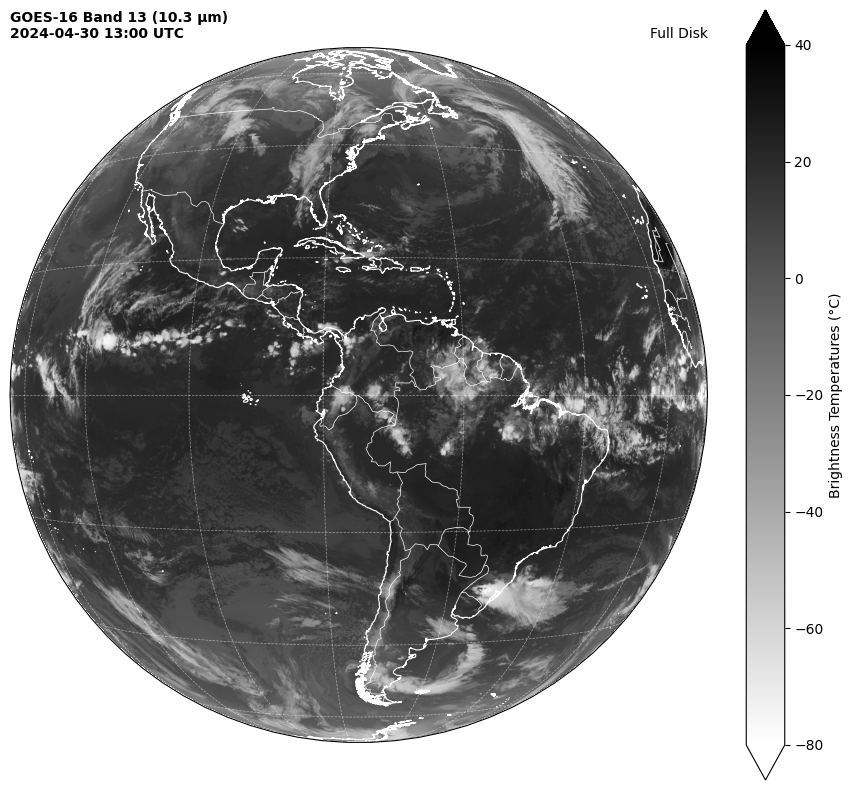

In [ ]:
#========================================================================================================================#
# CPAM Training - Satellite Applications for Nowcasting - Script 1: Downloading GOES-16 Data from the Cloud
#========================================================================================================================#
#========================================================================================================================#
#                                            REQUIRED MODULES
#========================================================================================================================#
from netCDF4 import Dataset         # Read / Write NetCDF4 files
import matplotlib.pyplot as plt     # Plotting library
import cartopy, cartopy.crs as ccrs # Plot maps
from datetime import datetime       # Basic Dates and time types
from utilities import download_CMI  # Our own utilities
import os                           # Miscellaneous operating system interfaces

#========================================================================================================================#
#                                          INPUT AND OUTPUT DIRECTORIES
#========================================================================================================================#
input = "/content/samples"; os.makedirs(input, exist_ok=True)
output = "/content/output"; os.makedirs(output, exist_ok=True)

#========================================================================================================================#
#                                              DOWNLOAD THE FILE
#========================================================================================================================#
# Datetime to process
yyyymmddhhmn = '202404301300'

# Channel to be downloaded
band = '13'

# Download the GOES-R file (CMI: "Cloud and Moisture Imagery" Product)
file_name = download_CMI(yyyymmddhhmn, band, input)

#========================================================================================================================#
#                                               READ THE FILE
#========================================================================================================================#
# Open the GOES-R image
file = Dataset(f'{input}/{file_name}.nc')

# Get the pixel values and convert from K to °C
data = file.variables['CMI'][:] - 273.15

#========================================================================================================================#
#                                              PLOT THE FIGURE
#========================================================================================================================#
# Choose the plot size (width x height, in inches)
plt.figure(figsize=(10,10))

# Use the Geostationary projection in cartopy
ax = plt.axes(projection=ccrs.Geostationary(central_longitude=-75.0, satellite_height=35786023.0))
img_extent = (-5434894.67527, 5434894.67527, -5434894.67527, 5434894.67527)

# Add coastlines, borders and gridlines
ax.coastlines(resolution='10m', color='white', linewidth=0.8)
ax.add_feature(cartopy.feature.BORDERS, edgecolor='white', linewidth=0.5)
ax.gridlines(color='white', alpha=0.5, linestyle='--', linewidth=0.5)

# Define the color scale based on the channel
colormap = "gray_r" # Reverse grayscale - thite to black for IR channels

# Plot the image
vmin = -80; vmax = 40
img = ax.imshow(data, origin='upper', vmin=vmin, vmax=vmax, extent=img_extent, cmap=colormap)

# Add a colorbar
plt.colorbar(img, label='Brightness Temperatures (°C)', extend='both', orientation='vertical', pad=0.05, fraction=0.05)

# read the time/date from the NetCDF file metadata as a string
date = (datetime.strptime(file.time_coverage_start, '%Y-%m-%dT%H:%M:%S.%fZ')).strftime('%Y-%m-%d %H:%M UTC')

# Add a title
plt.title(f'GOES-16 Band 13 (10.3 µm)\n{date}', fontweight='bold', fontsize=10, loc='left')
plt.title('Full Disk', fontsize=10, loc='right')

# Save the image
plt.savefig(f'{output}/script_1_{date.replace(" ", "_")}.png')

# Show the image
plt.show()

#**Script 02** - Projeção Retangular e Imagem em Níveis de Cinza

Neste segundo script vamos reprojetar a imagem ABI, da projeção GOES-R para a projeção "cilíndrica equidistante", utilizando a biblioteca GDAL (https://gdal.org/api/python_bindings.html). O dado reprojetado será visualizado em escala de cinza invertida (branco para temperaturas de brilho mais baixas e preto para temperaturas de brilho mais altas).

O que podemos modificar facilmente?

**1. A região desejada (variável "extent")**

File /content/samples/OR_ABI-L2-CMIPF-M6C13_G16_s20241211300205_e20241211309524_c20241211309588.nc exists


/usr/local/lib/python3.10/dist-packages/cartopy/io/__init__.py:241: DownloadWarning: Downloading: https://naturalearth.s3.amazonaws.com/10m_cultural/ne_10m_admin_0_boundary_lines_land.zip
  warnings.warn(f'Downloading: {url}', DownloadWarning)


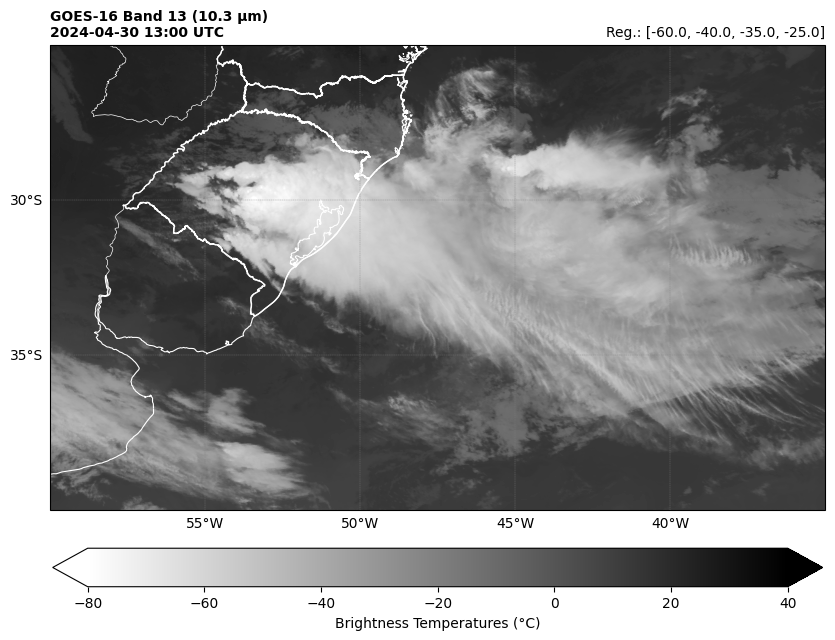

In [ ]:
#========================================================================================================================#
# CPAM Training - Satellite Applications for Nowcasting - Script 2: Reprojection and Image in Grayscale
#========================================================================================================================#
#========================================================================================================================#
#                                            REQUIRED MODULES
#========================================================================================================================#
from netCDF4 import Dataset                   # Read / Write NetCDF4 files
import matplotlib.pyplot as plt               # Plotting library
import cartopy, cartopy.crs as ccrs           # Plot maps
import cartopy.io.shapereader as shpreader    # Read shapefiles
from datetime import datetime                 # Basic Dates and time types
from utilities import download_CMI            # Our own utilities
import os                                     # Miscellaneous operating system interfaces
import numpy as np                            # Scientific computing with Python
from osgeo import osr                         # Python bindings for GDAL
from osgeo import gdal                        # Python bindings for GDAL
gdal.PushErrorHandler('CPLQuietErrorHandler') # Ignore GDAL warnings

#========================================================================================================================#
#                                          INPUT AND OUTPUT DIRECTORIES
#========================================================================================================================#
input = "/content/samples"; os.makedirs(input, exist_ok=True)
output = "/content/output"; os.makedirs(output, exist_ok=True)

#========================================================================================================================#
#                                              DOWNLOAD THE FILE
#========================================================================================================================#
# Datetime to process
yyyymmddhhmn = '202404301300'

# Channel to be downloaded
band = '13'

# Download the GOES-R file (CMI: "Cloud and Moisture Imagery" Product)
file_name = download_CMI(yyyymmddhhmn, band, input)

# Desired extent
extent = [-60.00, -40.00, -35.00, -25.00] # Min lon, Min lat, Max lon, Max lat

#========================================================================================================================#
#                                               REPROJECT THE DATA
#========================================================================================================================#
# Variable ('CMI' - Cloud and Moisture Imagery)
var = 'CMI'

# Open the file
img = gdal.Open(f'NETCDF:{input}/{file_name}.nc:' + var)

# Read the header metadata
metadata = img.GetMetadata()
scale = float(metadata.get(var + '#scale_factor'))
offset = float(metadata.get(var + '#add_offset'))
undef = float(metadata.get(var + '#_FillValue'))
dtime = metadata.get('NC_GLOBAL#time_coverage_start')

# Load the data
ds = img.ReadAsArray(0, 0, img.RasterXSize, img.RasterYSize).astype(float)

# Apply the scale, offset and convert to celsius
ds = (ds * scale + offset) - 273.15

# Read the original file projection and configure the output projection
source_prj = osr.SpatialReference()
source_prj.ImportFromProj4(img.GetProjectionRef())

target_prj = osr.SpatialReference()
target_prj.ImportFromProj4("+proj=longlat +ellps=WGS84 +datum=WGS84 +no_defs")

# Reproject the data
GeoT = img.GetGeoTransform()
driver = gdal.GetDriverByName('MEM')
raw = driver.Create('raw', ds.shape[0], ds.shape[1], 1, gdal.GDT_Float32)
raw.SetGeoTransform(GeoT)
raw.GetRasterBand(1).WriteArray(ds)

# Define the parameters of the output file
options = gdal.WarpOptions(format = 'netCDF',
                           srcSRS = source_prj,
                           dstSRS = target_prj,
                           outputBounds = (extent[0], extent[3], extent[2], extent[1]),
                           outputBoundsSRS = target_prj,
                           outputType = gdal.GDT_Float32,
                           srcNodata = undef,
                           dstNodata = 'nan',
                           xRes = 0.02,
                           yRes = 0.02,
                           resampleAlg = gdal.GRA_NearestNeighbour)

# Write the reprojected file on disk
gdal.Warp(f'{output}/{file_name}_ret.nc', raw, options=options)

#========================================================================================================================#
#                                               READ THE REPROJECTED FILE
#========================================================================================================================#
# Open the reprojected GOES-R image
file = Dataset(f'{output}/{file_name}_ret.nc')

# Get the pixel values
data = file.variables['Band1'][:]

#========================================================================================================================#
#                                                    PLOT THE FIGURE
#========================================================================================================================#
# Choose the plot size (width x height, in inches)
plt.figure(figsize=(10,10))

# Use the Geostationary projection in cartopy
ax = plt.axes(projection=ccrs.PlateCarree())

# Define the image extent
img_extent = [extent[0], extent[2], extent[1], extent[3]] # Min lon, Max lon, Min lat, Max lat

# Define the color scale based on the channel
colormap = "gray_r" # Reverse grayscale - thite to black for IR channels

# Plot the image
vmin = -80; vmax = 40
img = ax.imshow(data, origin='upper', vmin=vmin, vmax=vmax, extent=img_extent, cmap=colormap)

# Add coastlines, borders and gridlines
ax.coastlines(resolution='10m', color='white', linewidth=0.8)
ax.add_feature(cartopy.feature.BORDERS, edgecolor='white', linewidth=0.5)
gl = ax.gridlines(crs=ccrs.PlateCarree(), color='gray', alpha=1.0, linestyle='--', linewidth=0.25, xlocs=np.arange(-180, 180, 5), ylocs=np.arange(-90, 90, 5), draw_labels=True)
gl.top_labels = False
gl.right_labels = False

# Plot states
shapefile = list(shpreader.Reader('https://github.com/evmpython/minicurso_nowcasting_CPAM2024/raw/main/shapefiles/BR_UF_2019.shp').geometries())
ax.add_geometries(shapefile, ccrs.PlateCarree(), edgecolor='white', facecolor='none', linewidth=1.0)

# Add a colorbar
plt.colorbar(img, label='Brightness Temperatures (°C)', extend='both', orientation='horizontal', pad=0.05, fraction=0.05)

# read the time/date from the NetCDF file metadata as a string
date = (datetime.strptime(dtime, '%Y-%m-%dT%H:%M:%S.%fZ')).strftime('%Y-%m-%d %H:%M UTC')

# Add a title
plt.title(f'GOES-16 Band 13 (10.3 µm)\n{date}', fontweight='bold', fontsize=10, loc='left')
plt.title('Reg.: ' + str(extent) , fontsize=10, loc='right')

# Save the image
plt.savefig(f'{output}/script_2_{date.replace(" ", "_")}.png', bbox_inches='tight', dpi=300)

# Show the image
plt.show()

#**Script 03** - Projeção Retangular com Realce

Neste terceiro script vamos reprojetar a imagem e visualizá-la em escala colorida, realçando a imagem IR. Para isso, vamos utilizar a função **"loadCPT"**, criada para carregar uma paleta de cores no formato de arquivo ".cpt". Podemos acessar dezenas de escalas neste formato na seguinte página: http://seaviewsensing.com/pub/cpt-city/

File /content/samples/OR_ABI-L2-CMIPF-M6C13_G16_s20241211300205_e20241211309524_c20241211309588.nc exists


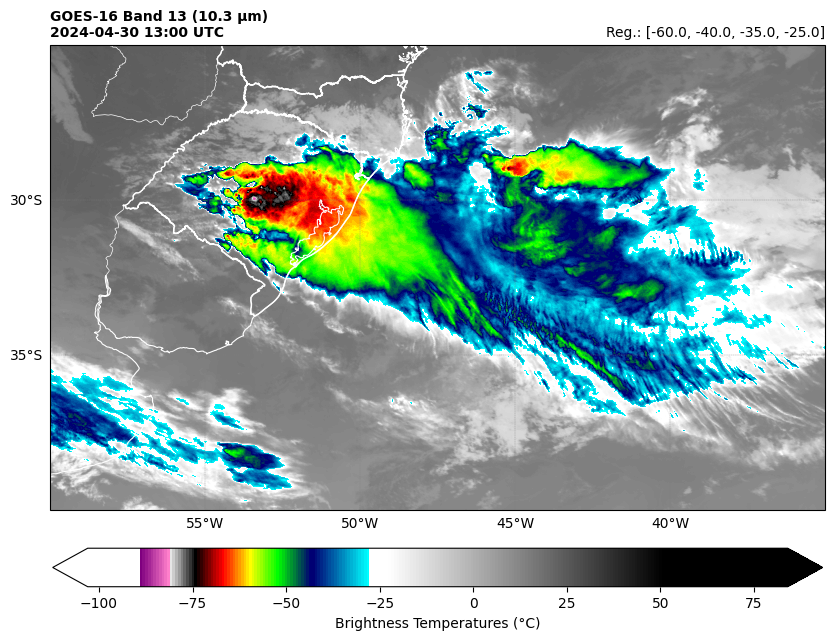

In [ ]:
#========================================================================================================================#
# CPAM Training - Satellite Applications for Nowcasting - Script 3: Reprojection and Enhanced Image
#========================================================================================================================#
#========================================================================================================================#
#                                            REQUIRED MODULES
#========================================================================================================================#
from netCDF4 import Dataset                   # Read / Write NetCDF4 files
import matplotlib.pyplot as plt               # Plotting library
from matplotlib import cm                     # Colormap handling utilities
import cartopy, cartopy.crs as ccrs           # Plot maps
import cartopy.io.shapereader as shpreader    # Read shapefiles
from datetime import datetime                 # Basic Dates and time types
from utilities import download_CMI            # Our own utilities
from utilities import loadCPT                 # Import the CPT convert function
import os                                     # Miscellaneous operating system interfaces
import numpy as np                            # Scientific computing with Python
from osgeo import osr                         # Python bindings for GDAL
from osgeo import gdal                        # Python bindings for GDAL
gdal.PushErrorHandler('CPLQuietErrorHandler') # Ignore GDAL warnings
import xarray as xr                           # Work with multidimensional arrays

#========================================================================================================================#
#                                          INPUT AND OUTPUT DIRECTORIES
#========================================================================================================================#
input = "/content/samples"; os.makedirs(input, exist_ok=True)
output = "/content/output"; os.makedirs(output, exist_ok=True)

#========================================================================================================================#
#                                              DOWNLOAD THE FILE
#========================================================================================================================#
# Datetime to process
yyyymmddhhmn = '202404301300'

# Channel to be downloaded
band = '13'

# Download the GOES-R file (CMI: "Cloud and Moisture Imagery" Product)
file_name = download_CMI(yyyymmddhhmn, band, input)

# Desired extent
extent = [-60.00, -40.00, -35.00, -25.00] # Min lon, Min lat, Max lon, Max lat

#========================================================================================================================#
#                                               REPROJECT THE DATA
#========================================================================================================================#
# Variable ('CMI' - Cloud and Moisture Imagery)
var = 'CMI'

# Open the file
img = gdal.Open(f'NETCDF:{input}/{file_name}.nc:' + var)

# Read the header metadata
metadata = img.GetMetadata()
scale = float(metadata.get(var + '#scale_factor'))
offset = float(metadata.get(var + '#add_offset'))
undef = float(metadata.get(var + '#_FillValue'))
dtime = metadata.get('NC_GLOBAL#time_coverage_start')

# Load the data
ds = img.ReadAsArray(0, 0, img.RasterXSize, img.RasterYSize).astype(float)

# Apply the scale, offset and convert to celsius
ds = (ds * scale + offset) - 273.15

# Read the original file projection and configure the output projection
source_prj = osr.SpatialReference()
source_prj.ImportFromProj4(img.GetProjectionRef())

target_prj = osr.SpatialReference()
target_prj.ImportFromProj4("+proj=longlat +ellps=WGS84 +datum=WGS84 +no_defs")

# Reproject the data
GeoT = img.GetGeoTransform()
driver = gdal.GetDriverByName('MEM')
raw = driver.Create('raw', ds.shape[0], ds.shape[1], 1, gdal.GDT_Float32)
raw.SetGeoTransform(GeoT)
raw.GetRasterBand(1).WriteArray(ds)

# Define the parameters of the output file
options = gdal.WarpOptions(format = 'netCDF',
          srcSRS = source_prj,
          dstSRS = target_prj,
          outputBounds = (extent[0], extent[3], extent[2], extent[1]),
          outputBoundsSRS = target_prj,
          outputType = gdal.GDT_Float32,
          srcNodata = undef,
          dstNodata = 'nan',
          xRes = 0.02,
          yRes = 0.02,
          resampleAlg = gdal.GRA_NearestNeighbour)

# Write the reprojected file on disk
gdal.Warp(f'{output}/{file_name}_ret.nc', raw, options=options)

#========================================================================================================================#
#                                               READ THE REPROJECTED FILE
#========================================================================================================================#
# Open the reprojected GOES-R image with Xarray library
data = xr.open_dataset(f'{output}/{file_name}_ret.nc')

#========================================================================================================================#
#                                                    PLOT THE FIGURE
#========================================================================================================================#
# Choose the plot size (width x height, in inches)
plt.figure(figsize=(10,10))

# Use the Geostationary projection in cartopy
ax = plt.axes(projection=ccrs.PlateCarree())

# Define the image extent
img_extent = [extent[0], extent[2], extent[1], extent[3]] # Min lon, Max lon, Min lat, Max lat

# Converts a CPT file to be used in Python
cpt = loadCPT('IR4AVHRR6.cpt')
colormap = cm.colors.LinearSegmentedColormap('cpt', cpt)

# Plot the image
vmin = -103.0; vmax = 84
img = ax.imshow(data['Band1'], origin='upper', vmin=vmin, vmax=vmax, extent=img_extent, cmap=colormap)

# Add coastlines, borders and gridlines
ax.coastlines(resolution='10m', color='white', linewidth=0.8)
ax.add_feature(cartopy.feature.BORDERS, edgecolor='white', linewidth=0.5)
gl = ax.gridlines(crs=ccrs.PlateCarree(), color='gray', alpha=1.0, linestyle='--', linewidth=0.25, xlocs=np.arange(-180, 180, 5), ylocs=np.arange(-90, 90, 5), draw_labels=True)
gl.top_labels = False
gl.right_labels = False

# Plot states
shapefile = list(shpreader.Reader('https://github.com/evmpython/minicurso_nowcasting_CPAM2024/raw/main/shapefiles/BR_UF_2019.shp').geometries())
ax.add_geometries(shapefile, ccrs.PlateCarree(), edgecolor='white', facecolor='none', linewidth=1.0)

# Add a colorbar
plt.colorbar(img, label='Brightness Temperatures (°C)', extend='both', orientation='horizontal', pad=0.05, fraction=0.05)

# read the time/date from the NetCDF file metadata as a string
date = (datetime.strptime(dtime, '%Y-%m-%dT%H:%M:%S.%fZ')).strftime('%Y-%m-%d %H:%M UTC')

# Add a title
plt.title(f'GOES-16 Band 13 (10.3 µm)\n{date}', fontweight='bold', fontsize=10, loc='left')
plt.title('Reg.: ' + str(extent) , fontsize=10, loc='right')

# Save the image
plt.savefig(f'{output}/script_3_{date.replace(" ", "_")}.png', bbox_inches='tight', dpi=300)

# Show the image
plt.show()

#**Script 04** - Imagem IR (10.35 μm) + Total de Flashes do GLM

Neste script, além das operações anteriores, vamos realizar o download dos arquivos do sensor GLM (disponíveis cada 20 s), disponíveis no [repositório da AWS](https://noaa-goes16.s3.amazonaws.com/index.html#GLM-L2-LCFA/). Iremos acumular os flashes detectados através de um loop, e com a biblioteca Pandas (https://pandas.pydata.org/) realizar a filtragem e contagem dos flashes totais na região definida na variável "extent". Os flashes totais são mostrados através de marcadores e a função "scatter" da matplotlib (https://matplotlib.org/stable/api/_as_gen/matplotlib.pyplot.scatter.html).

File /content/samples/OR_ABI-L2-CMIPF-M6C13_G16_s20241211300205_e20241211309524_c20241211309588.nc exists


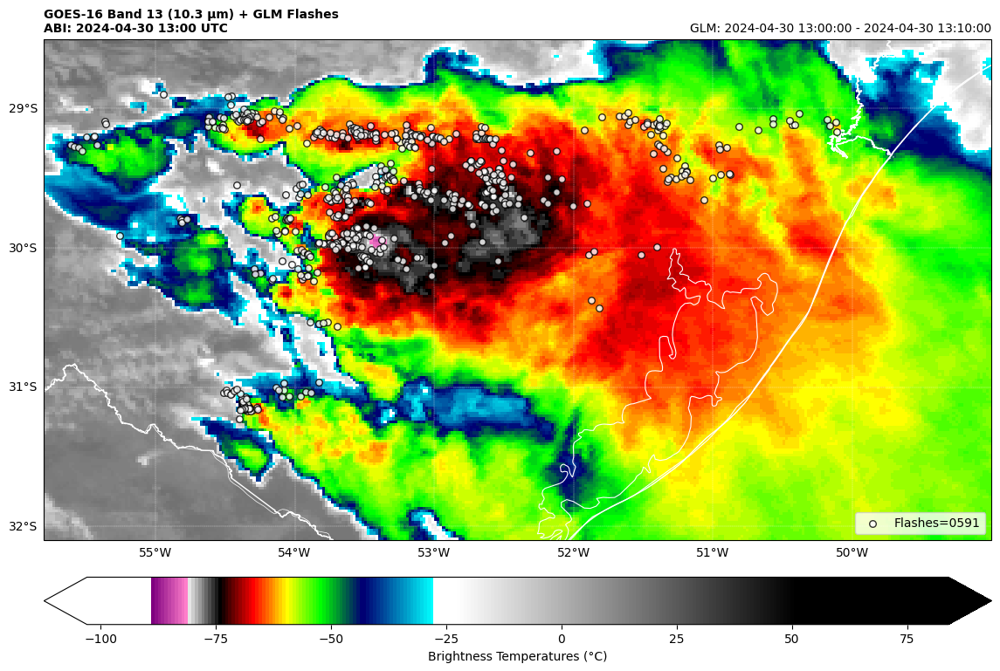

In [ ]:
#========================================================================================================================#
# CPAM Training - Satellite Applications for Nowcasting - Script 4: IR Image (10.35 μm) + GLM Flashes
#========================================================================================================================#
#========================================================================================================================#
#                                            REQUIRED MODULES
#========================================================================================================================#
from netCDF4 import Dataset                      # Read / Write NetCDF4 files
import matplotlib.pyplot as plt                  # Plotting library
from matplotlib import cm                        # Colormap handling utilities
import cartopy, cartopy.crs as ccrs              # Plot maps
import cartopy.io.shapereader as shpreader       # Read shapefiles
from datetime import timedelta, datetime         # Basic Dates and time types
from utilities import download_CMI, download_GLM # Our own utilities
from utilities import loadCPT                    # Import the CPT convert function
from utilities import reproject                  # Our function for reproject
import os                                        # Miscellaneous operating system interfaces
import numpy as np                               # Scientific computing with Python
from osgeo import osr                            # Python bindings for GDAL
from osgeo import gdal                           # Python bindings for GDAL
gdal.PushErrorHandler('CPLQuietErrorHandler')    # Ignore GDAL warnings
import xarray as xr                              # Work with multidimensional arrays
import pandas as pd                              # Work with dataframes

#========================================================================================================================#
#                                        INPUT AND OUTPUT DIRECTORIES
#========================================================================================================================#
input = "/content/samples"; os.makedirs(input, exist_ok=True)
output = "/content/output"; os.makedirs(output, exist_ok=True)

#========================================================================================================================#
#                                              DOWNLOAD THE FILE
#========================================================================================================================#
# Datetime to process
yyyymmddhhmn = '202404301300'

# Channel
band = '13'

# Download the file
file_name = download_CMI(yyyymmddhhmn, band, input)

# Desired extent
extent = [-55.8, -32.1, -49.0, -28.5] # Min lon, Min lat, Max lon, Max lat
#========================================================================================================================#
#                                               REPROJECT THE DATA
#========================================================================================================================#
# Variable ('CMI' - Cloud and Moisture Imagery)
var = 'CMI'

# Open the file
img = gdal.Open(f'NETCDF:{input}/{file_name}.nc:' + var)

# Read the header metadata
metadata = img.GetMetadata()
scale = float(metadata.get(var + '#scale_factor'))
offset = float(metadata.get(var + '#add_offset'))
undef = float(metadata.get(var + '#_FillValue'))
dtime = metadata.get('NC_GLOBAL#time_coverage_start')

# Load the data
ds = img.ReadAsArray(0, 0, img.RasterXSize, img.RasterYSize).astype(float)

# Apply the scale, offset and convert to celsius
ds = (ds * scale + offset) - 273.15

# Read the original file projection and configure the output projection
source_prj = osr.SpatialReference()
source_prj.ImportFromProj4(img.GetProjectionRef())

target_prj = osr.SpatialReference()
target_prj.ImportFromProj4("+proj=longlat +ellps=WGS84 +datum=WGS84 +no_defs")

# Reproject the data
GeoT = img.GetGeoTransform()
driver = gdal.GetDriverByName('MEM')
raw = driver.Create('raw', ds.shape[0], ds.shape[1], 1, gdal.GDT_Float32)
raw.SetGeoTransform(GeoT)
raw.GetRasterBand(1).WriteArray(ds)

# Define the parameters of the output file
options = gdal.WarpOptions(format = 'netCDF',
          srcSRS = source_prj,
          dstSRS = target_prj,
          outputBounds = (extent[0], extent[3], extent[2], extent[1]),
          outputBoundsSRS = target_prj,
          outputType = gdal.GDT_Float32,
          srcNodata = undef,
          dstNodata = 'nan',
          xRes = 0.02,
          yRes = 0.02,
          resampleAlg = gdal.GRA_NearestNeighbour)

# Write the reprojected file on disk
gdal.Warp(f'{output}/{file_name}_ret.nc', raw, options=options)

#========================================================================================================================#
#                                              READ THE REPROJECTED FILE
#========================================================================================================================#
# Open the reprojected GOES-R image
data = xr.open_dataset(f'{output}/{file_name}_ret.nc')

#========================================================================================================================#
#                                                    GET GLM DATA
#========================================================================================================================#
# Initialize arrays for latitude and longitude of flashes
lats_flash = np.array([])
lons_flash = np.array([])

# Initial time and date
yyyy = datetime.strptime(yyyymmddhhmn, '%Y%m%d%H%M').strftime('%Y')
mm = datetime.strptime(yyyymmddhhmn, '%Y%m%d%H%M').strftime('%m')
dd = datetime.strptime(yyyymmddhhmn, '%Y%m%d%H%M').strftime('%d')
hh = datetime.strptime(yyyymmddhhmn, '%Y%m%d%H%M').strftime('%H')
mn = datetime.strptime(yyyymmddhhmn, '%Y%m%d%H%M').strftime('%M')

date_ini = str(datetime(int(yyyy),int(mm),int(dd),int(hh),int(mn)))
date_end = str(datetime(int(yyyy),int(mm),int(dd),int(hh),int(mn)) + timedelta(minutes=10))

# GLM accumulation loop
while (date_ini <= date_end):

    # Date structure
    yyyymmddhhmnss = datetime.strptime(date_ini, '%Y-%m-%d %H:%M:%S').strftime('%Y%m%d%H%M%S')

    # Download the file
    file_glm = download_GLM(yyyymmddhhmnss, input)

    # Read the file
    glm_20s = Dataset(f'{input}/{file_glm}.nc')

    # Append lats / longs
    lats_flash = np.append(lats_flash, glm_20s.variables['flash_lat'][:])
    lons_flash = np.append(lons_flash, glm_20s.variables['flash_lon'][:])

    # Increment the date_ini
    date_ini = str(datetime.strptime(date_ini, '%Y-%m-%d %H:%M:%S') + timedelta(seconds=20))

# Select the flashes inside the region
# put the flashes into dataframe
data_flash = {'lat': lats_flash, 'lon': lons_flash}
df = pd.DataFrame(data_flash)

# select the flashes from region of interest
df_flash_filtered = df[ (df['lon'] > extent[0]) & (df['lon'] < extent[2]) & (df['lat'] > extent[1]) & (df['lat'] < extent[3])]

# transform from dataframe to array
lons_flash_filtered, lats_flash_filtered = df_flash_filtered['lon'].values, df_flash_filtered['lat'].values

#========================================================================================================================#
#                                                 PLOT THE FIGURE
#========================================================================================================================#
# Choose the plot size (width x height, in inches)
plt.figure(figsize=(14,11))

# Use the Geostationary projection in cartopy
ax = plt.axes(projection=ccrs.PlateCarree())

# Define the data extent
img_extent = [extent[0], extent[2], extent[1], extent[3]]

# Converts a CPT file to be used in Python
cpt = loadCPT('IR4AVHRR6.cpt')
colormap = cm.colors.LinearSegmentedColormap('cpt', cpt)

# Plot the image
vmin = -103.0; vmax = 84
img = ax.imshow(data['Band1'], origin='upper', vmin=vmin, vmax=vmax, extent=img_extent, cmap=colormap)

# Plot the GLM Data
glm = plt.scatter(lons_flash_filtered, lats_flash_filtered, transform=ccrs.PlateCarree(), marker='o', s=30, facecolor='white', edgecolor='black', linewidth=1, alpha=0.8, zorder=2,
                  label=f'Flashes={str(len(lats_flash_filtered)).zfill(4)}')

# Add legend
ax.legend(loc='lower right', ncols=1, facecolor='white', frameon=True)

# Add coastlines, borders and gridlines
ax.coastlines(resolution='10m', color='white', linewidth=0.8)
ax.add_feature(cartopy.feature.BORDERS, edgecolor='white', linewidth=0.5)
gl = ax.gridlines(crs=ccrs.PlateCarree(), color='white', alpha=1.0, linestyle='--', linewidth=0.25, xlocs=np.arange(-180, 180, 1), ylocs=np.arange(-90, 90, 1), draw_labels=True)
gl.top_labels = False
gl.right_labels = False

# Plot states
shapefile = list(shpreader.Reader('https://github.com/evmpython/minicurso_nowcasting_CPAM2024/raw/main/shapefiles/BR_UF_2019.shp').geometries())
ax.add_geometries(shapefile, ccrs.PlateCarree(), edgecolor='white', facecolor='none', linewidth=1.0)

# Add a colorbar
plt.colorbar(img, label='Brightness Temperatures (°C)', extend='both', orientation='horizontal', pad=0.05)#, fraction=0.05)

# read the time/date from the NetCDF file metadata as a string
date = (datetime.strptime(dtime, '%Y-%m-%dT%H:%M:%S.%fZ')).strftime('%Y-%m-%d %H:%M UTC')

# Add a title
plt.title(f'GOES-16 Band 13 (10.3 µm) + GLM Flashes\nABI: {date}', fontweight='bold', fontsize=10, loc='left')
date_ini = str(datetime(int(yyyy),int(mm),int(dd),int(hh),int(mn)))
date_end = str(datetime(int(yyyy),int(mm),int(dd),int(hh),int(mn)) + timedelta(minutes=10))
plt.title(f'GLM: {str(date_ini)} - {str(date_end)}', fontsize="10", loc="right")

# Save the image
plt.savefig(f'{output}/script_4_{date.replace(" ", "_")}.png', bbox_inches='tight', dpi=300)

# Show the image
plt.show()

#**Script 05** - Imagem IR (10.35 μm) + Densidade de Eventos do GLM

Esse script é semelhante ao anterior, onde realizamos o download e acumulação de dados do sensor GLM em um loop. Neste exemplo, ao invés de acumular os flashes estamos acumulando os eventos GLM. Realizamos a contagem de eventos detectados em uma mesma coordenada, e quanto mais eventos em uma mesma coordenada, mais quente a cor e maior o círculo plotado através do comando "scatter" da biblioteca matplotlib.

File /content/samples/OR_ABI-L2-CMIPF-M6C13_G16_s20241211300205_e20241211309524_c20241211309588.nc exists
File /content/samples/OR_GLM-L2-LCFA_G16_s20241211300000_e20241211300200_c20241211300212.nc exists
File /content/samples/OR_GLM-L2-LCFA_G16_s20241211300200_e20241211300400_c20241211300416.nc exists
File /content/samples/OR_GLM-L2-LCFA_G16_s20241211300400_e20241211301000_c20241211301017.nc exists
File /content/samples/OR_GLM-L2-LCFA_G16_s20241211301000_e20241211301200_c20241211301214.nc exists
File /content/samples/OR_GLM-L2-LCFA_G16_s20241211301200_e20241211301400_c20241211301413.nc exists
File /content/samples/OR_GLM-L2-LCFA_G16_s20241211301400_e20241211302000_c20241211302020.nc exists
File /content/samples/OR_GLM-L2-LCFA_G16_s20241211302000_e20241211302200_c20241211302215.nc exists
File /content/samples/OR_GLM-L2-LCFA_G16_s20241211302200_e20241211302400_c20241211302419.nc exists
File /content/samples/OR_GLM-L2-LCFA_G16_s20241211302400_e20241211303000_c20241211303015.nc exists
Fil

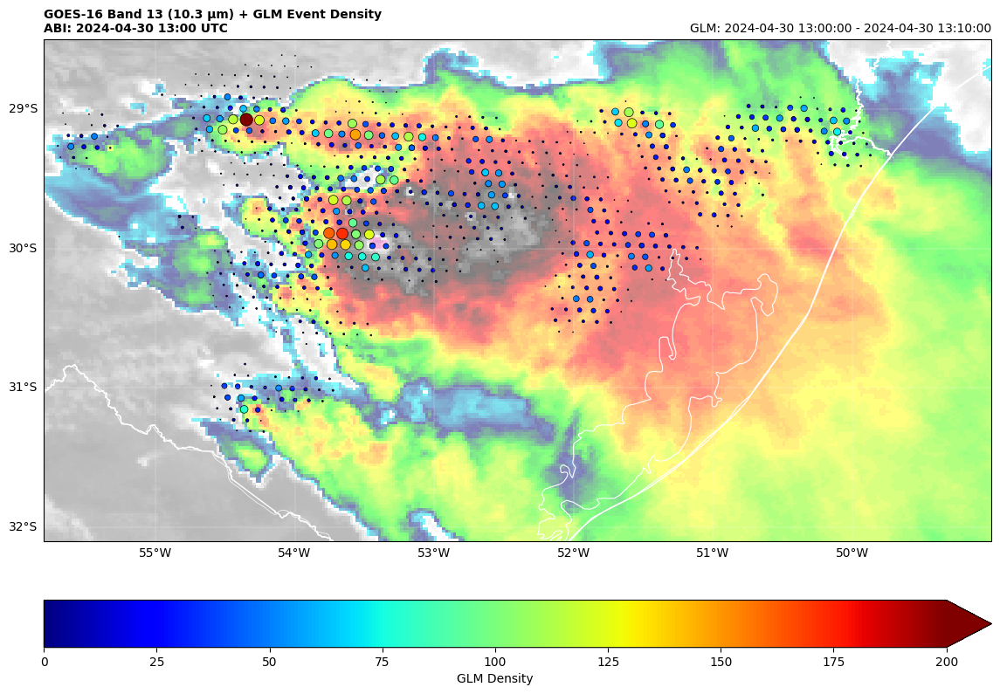

In [ ]:
#========================================================================================================================#
# CPAM Training - Satellite Applications for Nowcasting - Script 5: IR Image (10.35 μm) + GLM Event Density
#========================================================================================================================#
#========================================================================================================================#
#                                            REQUIRED MODULES
#========================================================================================================================#
from netCDF4 import Dataset                      # Read / Write NetCDF4 files
import matplotlib.pyplot as plt                  # Plotting library
from matplotlib import cm                        # Colormap handling utilities
import cartopy, cartopy.crs as ccrs              # Plot maps
import cartopy.io.shapereader as shpreader       # Read shapefiles
from datetime import timedelta, datetime         # Basic Dates and time types
from utilities import download_CMI, download_GLM # Our own utilities
from utilities import loadCPT                    # Import the CPT convert function
from utilities import reproject                  # Our function for reproject
import os                                        # Miscellaneous operating system interfaces
import numpy as np                               # Scientific computing with Python
from osgeo import osr                            # Python bindings for GDAL
from osgeo import gdal                           # Python bindings for GDAL
gdal.PushErrorHandler('CPLQuietErrorHandler')    # Ignore GDAL warnings

#========================================================================================================================#
#                                        INPUT AND OUTPUT DIRECTORIES
#========================================================================================================================#
input = "/content/samples"; os.makedirs(input, exist_ok=True)
output = "/content/output"; os.makedirs(output, exist_ok=True)

#========================================================================================================================#
#                                              DOWNLOAD THE FILE
#========================================================================================================================#
# Datetime to process
yyyymmddhhmn = '202404301300'

# Channel
band = '13'

# Download the file
file_name = download_CMI(yyyymmddhhmn, band, input)

# Desired extent
extent = [-55.8, -32.1, -49.0, -28.5] # Min lon, Max lon, Min lat, Max lat
#========================================================================================================================#
#                                               REPROJECT THE DATA
#========================================================================================================================#
# Variable ('CMI' - Cloud and Moisture Imagery)
var = 'CMI'

# Open the file
img = gdal.Open(f'NETCDF:{input}/{file_name}.nc:' + var)

# Read the header metadata
metadata = img.GetMetadata()
scale = float(metadata.get(var + '#scale_factor'))
offset = float(metadata.get(var + '#add_offset'))
undef = float(metadata.get(var + '#_FillValue'))
dtime = metadata.get('NC_GLOBAL#time_coverage_start')

# Load the data
ds = img.ReadAsArray(0, 0, img.RasterXSize, img.RasterYSize).astype(float)

# Apply the scale, offset and convert to celsius
ds = (ds * scale + offset) - 273.15

# Read the original file projection and configure the output projection
source_prj = osr.SpatialReference()
source_prj.ImportFromProj4(img.GetProjectionRef())

target_prj = osr.SpatialReference()
target_prj.ImportFromProj4("+proj=longlat +ellps=WGS84 +datum=WGS84 +no_defs")

# Reproject the data
GeoT = img.GetGeoTransform()
driver = gdal.GetDriverByName('MEM')
raw = driver.Create('raw', ds.shape[0], ds.shape[1], 1, gdal.GDT_Float32)
raw.SetGeoTransform(GeoT)
raw.GetRasterBand(1).WriteArray(ds)

# Define the parameters of the output file
options = gdal.WarpOptions(format = 'netCDF',
                           srcSRS = source_prj,
                           dstSRS = target_prj,
                           outputBounds = (extent[0], extent[3], extent[2], extent[1]),
                           outputBoundsSRS = target_prj,
                           outputType = gdal.GDT_Float32,
                           srcNodata = undef,
                           dstNodata = 'nan',
                           xRes = 0.02,
                           yRes = 0.02,
                           resampleAlg = gdal.GRA_NearestNeighbour)

# Write the reprojected file on disk
gdal.Warp(f'{output}/{file_name}_ret.nc', raw, options=options)

#========================================================================================================================#
#                                               READ THE REPROJECTED FILE
#========================================================================================================================#
# Open the reprojected GOES-R image
file = Dataset(f'{output}/{file_name}_ret.nc')

# Get the pixel values
data = file.variables['Band1'][:]

#========================================================================================================================#
#                                               GET GLM DATA
#========================================================================================================================#
# Initialize arrays for latitude, longitude, and event energy
lats = np.array([])
lons = np.array([])

# Initial time and date
yyyy = datetime.strptime(yyyymmddhhmn, '%Y%m%d%H%M').strftime('%Y')
mm = datetime.strptime(yyyymmddhhmn, '%Y%m%d%H%M').strftime('%m')
dd = datetime.strptime(yyyymmddhhmn, '%Y%m%d%H%M').strftime('%d')
hh = datetime.strptime(yyyymmddhhmn, '%Y%m%d%H%M').strftime('%H')
mn = datetime.strptime(yyyymmddhhmn, '%Y%m%d%H%M').strftime('%M')

date_ini = str(datetime(int(yyyy),int(mm),int(dd),int(hh),int(mn)))
date_end = str(datetime(int(yyyy),int(mm),int(dd),int(hh),int(mn)) + timedelta(minutes=10))

# GLM accumulation loop
while (date_ini <= date_end):

    # Date structure
    yyyymmddhhmnss = datetime.strptime(date_ini, '%Y-%m-%d %H:%M:%S').strftime('%Y%m%d%H%M%S')

    # Download the file
    file_glm = download_GLM(yyyymmddhhmnss, input)

    # Read the file
    glm_20s = Dataset(f'{input}/{file_glm}.nc')

    # Append lats / lons
    lats = np.append(lats, glm_20s.variables['event_lat'][:])
    lons = np.append(lons, glm_20s.variables['event_lon'][:])

    # Increment the date_ini
    date_ini = str(datetime.strptime(date_ini, '%Y-%m-%d %H:%M:%S') + timedelta(seconds=20))

# Stack and transpose the lat lons
values = np.vstack((lats, lons)).T

# Get the counts
points, counts = np.unique(values, axis=0, return_counts=True)

# Get the counts indices
idx = counts.argsort()

#========================================================================================================================#
#                                                 CREATE THE FIGURE
#========================================================================================================================#
# Choose the plot size (width x height, in inches)
plt.figure(figsize=(14,11))

# Use the Geostationary projection in cartopy
ax = plt.axes(projection=ccrs.PlateCarree())

# Define the image extent
ax.set_extent([extent[0], extent[2], extent[1], extent[3]], ccrs.PlateCarree())

# Define the data extent
img_extent = [extent[0], extent[2], extent[1], extent[3]]

# Plot the image
# Converts a CPT file to be used in Python
cpt = loadCPT('IR4AVHRR6.cpt')
colormap = cm.colors.LinearSegmentedColormap('cpt', cpt)
#ax.set_facecolor("white")

# Plot the image
vmin = -103.0; vmax = 84
img = ax.imshow(data, origin='upper', vmin=vmin, vmax=vmax, extent=img_extent, cmap=colormap, alpha=0.5, zorder=1)

# Plot the GLM Data
glm = plt.scatter(points[idx,1], points[idx,0], vmin=0, vmax=200, s=counts[idx]*0.5, c=counts[idx], marker='o', cmap="jet", edgecolor='black', linewidth=0.5, alpha=1.0, zorder=2)

# Add coastlines, borders and gridlines
ax.coastlines(resolution='10m', color='white', linewidth=0.8)
ax.add_feature(cartopy.feature.BORDERS, edgecolor='white', linewidth=0.5)
gl = ax.gridlines(crs=ccrs.PlateCarree(), color='white', alpha=1.0, linestyle='--', linewidth=0.25, xlocs=np.arange(-180, 180, 1), ylocs=np.arange(-90, 90, 1), draw_labels=True)
gl.top_labels = False
gl.right_labels = False

# Plot states
shapefile = list(shpreader.Reader('https://github.com/evmpython/minicurso_nowcasting_CPAM2024/raw/main/shapefiles/BR_UF_2019.shp').geometries())
ax.add_geometries(shapefile, ccrs.PlateCarree(), edgecolor='white', facecolor='none', linewidth=1.0)

# Add the GLM colorbar
plt.colorbar(glm, label='GLM Density', extend='max', orientation='horizontal', pad=0.08) #, fraction=0.05)

# Read the time/date from the NetCDF file metadata as a string
date = (datetime.strptime(dtime, '%Y-%m-%dT%H:%M:%S.%fZ')).strftime('%Y-%m-%d %H:%M UTC')

# Add a title
plt.title(f'GOES-16 Band 13 (10.3 µm) + GLM Event Density\nABI: {date}', fontweight='bold', fontsize=10, loc='left')
date_ini = str(datetime(int(yyyy),int(mm),int(dd),int(hh),int(mn)))
date_end = str(datetime(int(yyyy),int(mm),int(dd),int(hh),int(mn)) + timedelta(minutes=10))
plt.title(f'GLM: {str(date_ini)} - {str(date_end)}', fontsize="10", loc="right")

# Save the image
plt.savefig(f'{output}/script_5_{date.replace(" ", "_")}.png', bbox_inches='tight', pad_inches=0, dpi=300)

# Show the image
plt.show()

#**Script 06** - Evolução Temporal da Temperatura de Brilho do IR e Flashes GLM

Nesse último script, além da reprojeção de dados ABI e a acumulação de flashes GLM a cada 10 minutos, utilizaremos a biblioteca SALEM (https://salem.readthedocs.io/en/stable/) para extrair dados (temperatura de brilho ABI e flashes GLM) somente dentro da região de um shapefile específico (neste caso, da cidade de Santa Maria-RS). Após a obtenção desses dados, criamos um gráfico com as temperaturas de brilho média, mínima e número total de flashes.

## **Mapa**
- O processamento de 2h de imagens GOES-16 + GLM demora aproximadamente 3-5 min.

#=====================================================================================================#
                           PROCESSING THE IMAGE = 2024-04-30 1300 UTC
#=====================================================================================================#
File /content/samples/OR_ABI-L2-CMIPF-M6C13_G16_s20241211300205_e20241211309524_c20241211309588.nc exists
File /content/samples/OR_GLM-L2-LCFA_G16_s20241211300000_e20241211300200_c20241211300212.nc exists
File /content/samples/OR_GLM-L2-LCFA_G16_s20241211300200_e20241211300400_c20241211300416.nc exists
File /content/samples/OR_GLM-L2-LCFA_G16_s20241211300400_e20241211301000_c20241211301017.nc exists
File /content/samples/OR_GLM-L2-LCFA_G16_s20241211301000_e20241211301200_c20241211301214.nc exists
File /content/samples/OR_GLM-L2-LCFA_G16_s20241211301200_e20241211301400_c20241211301413.nc exists
File /content/samples/OR_GLM-L2-LCFA_G16_s20241211301400_e20241211302000_c20241211302020.nc exists
File /content/samples/

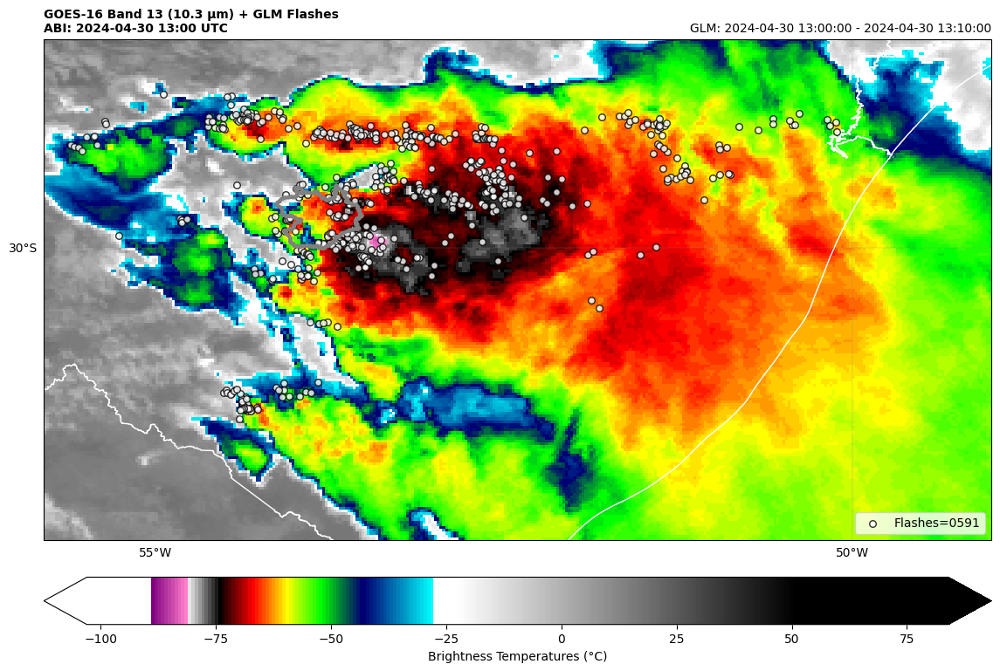

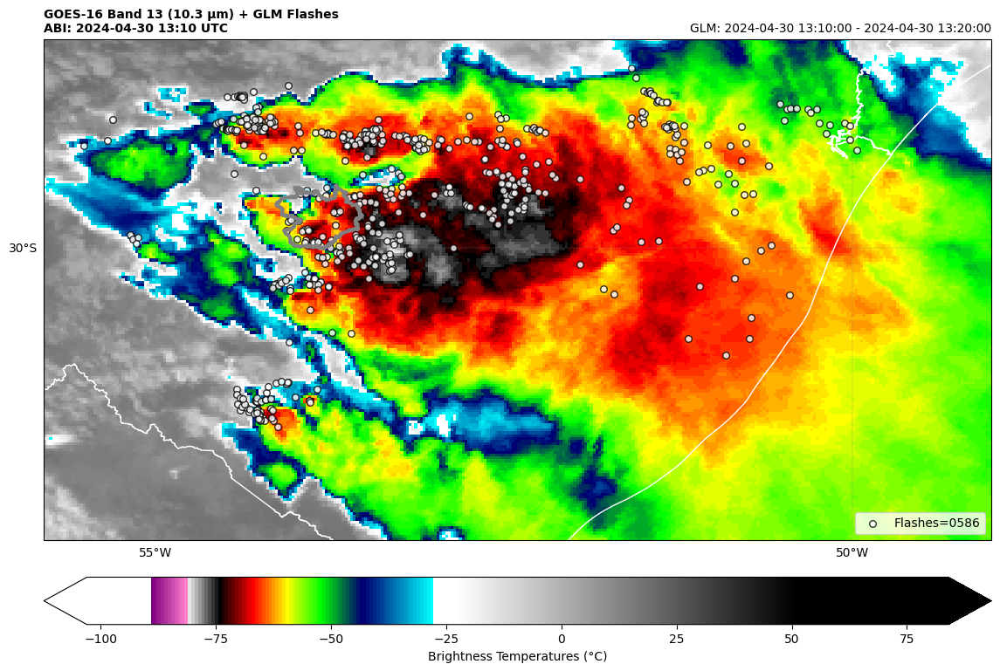

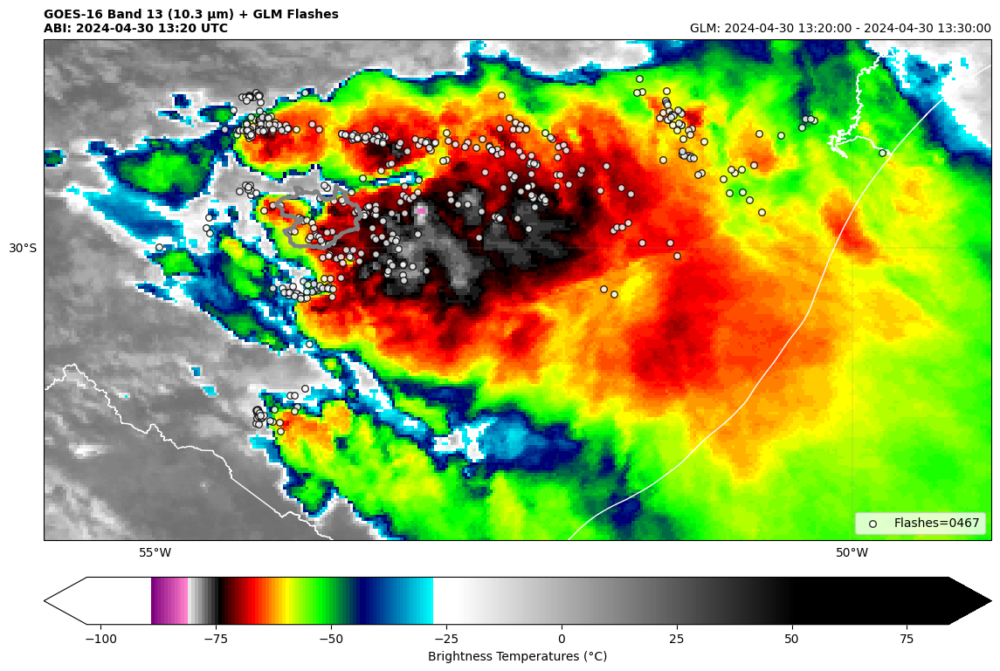

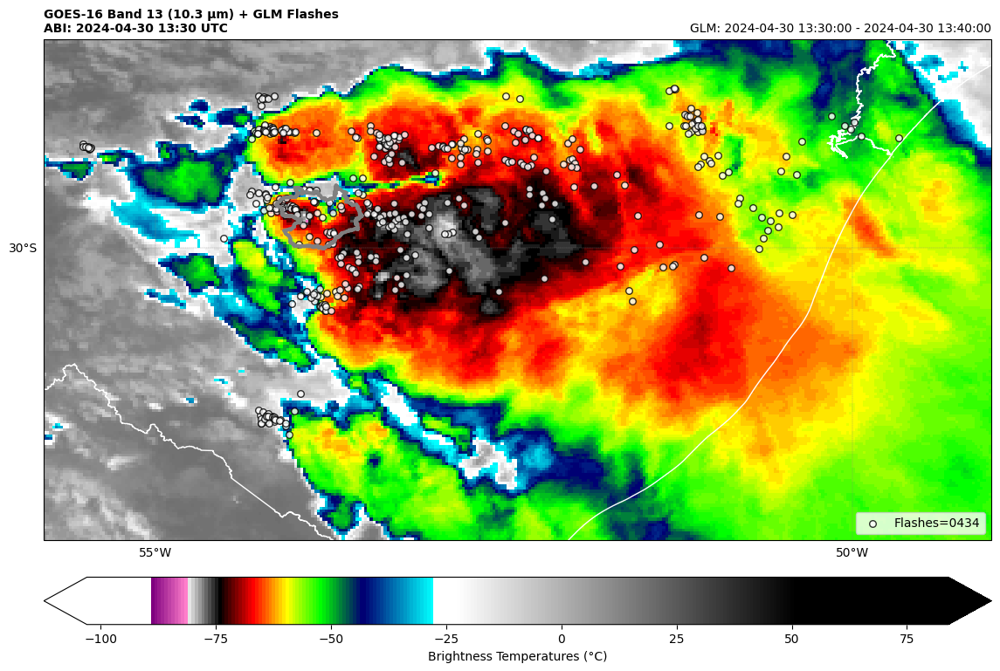

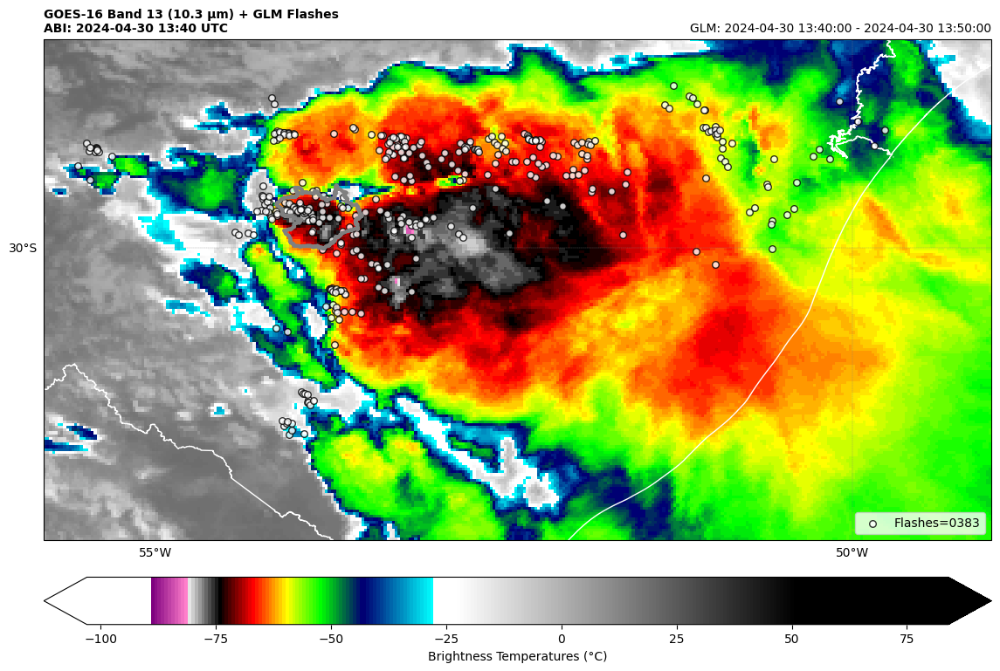

...

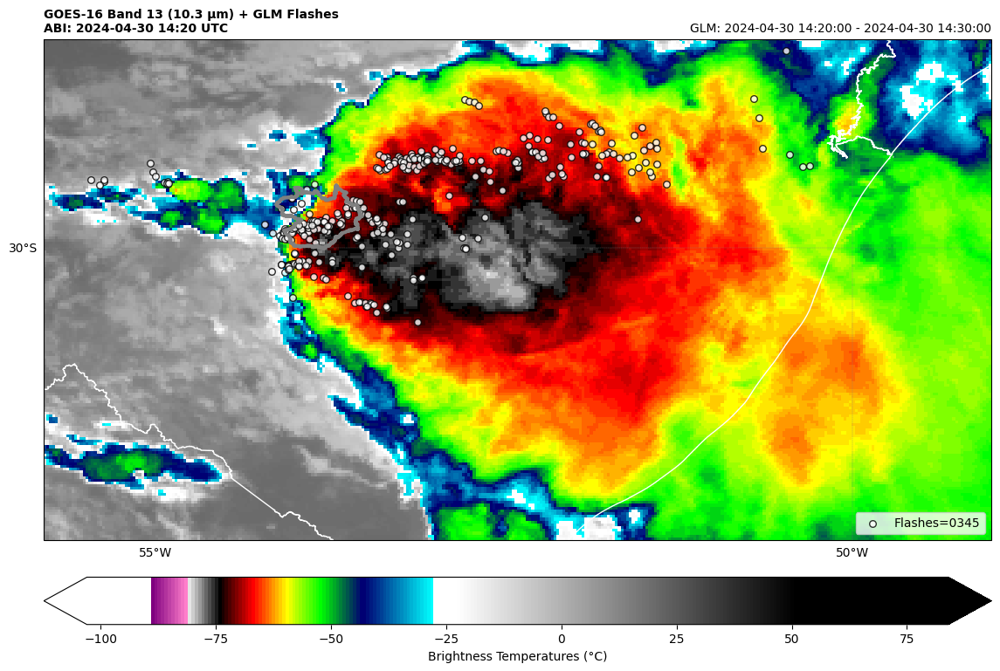

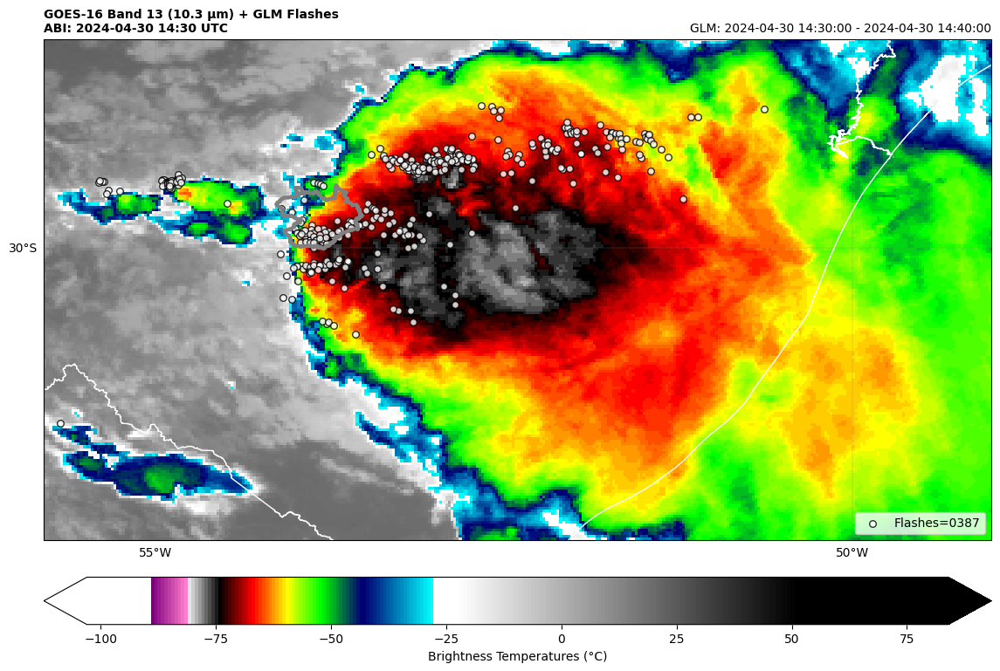

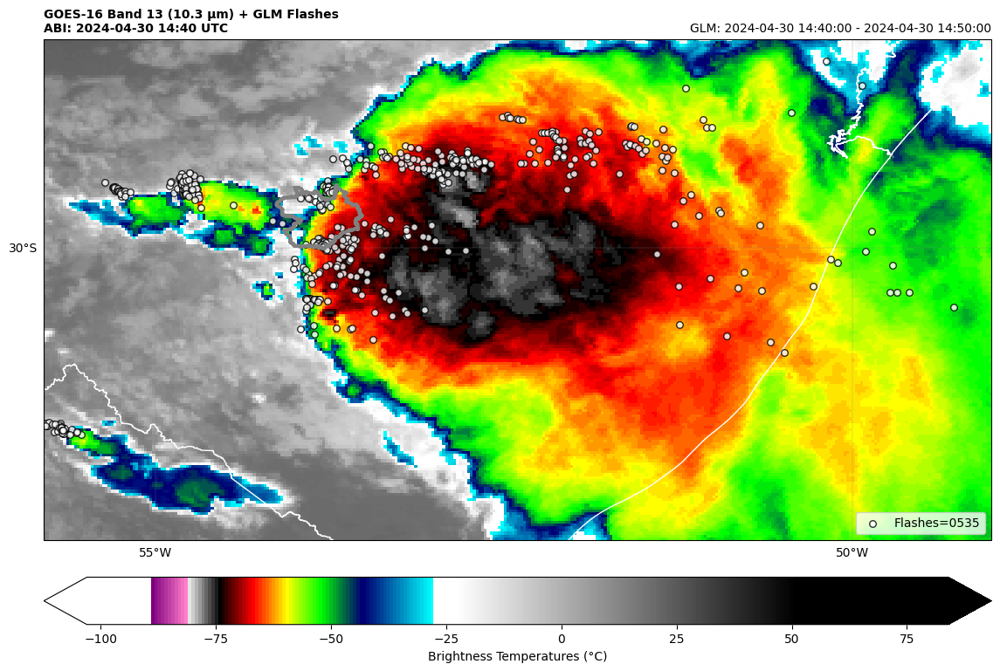

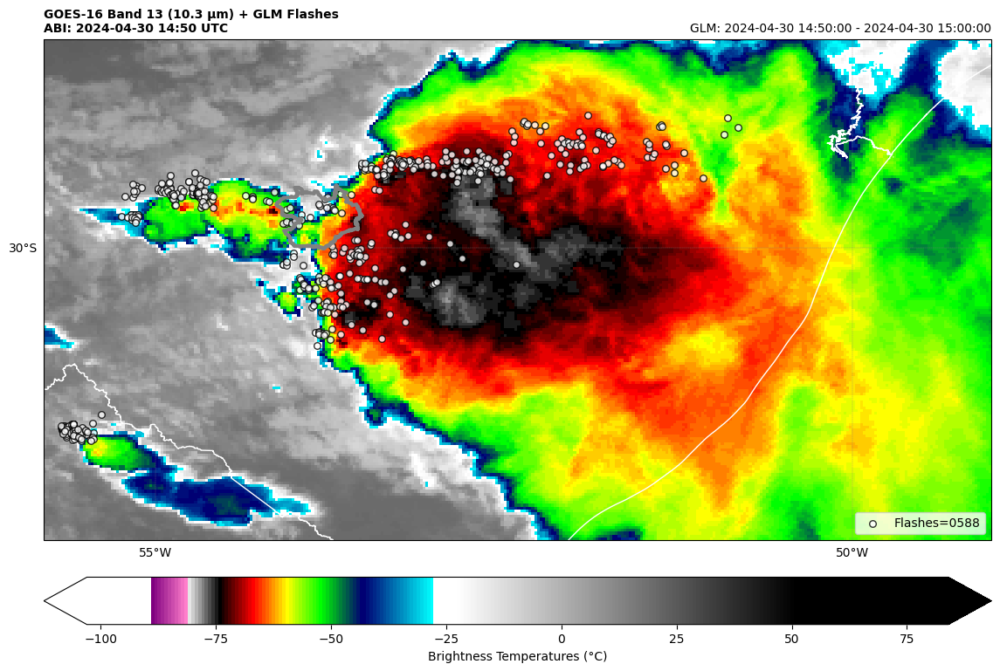

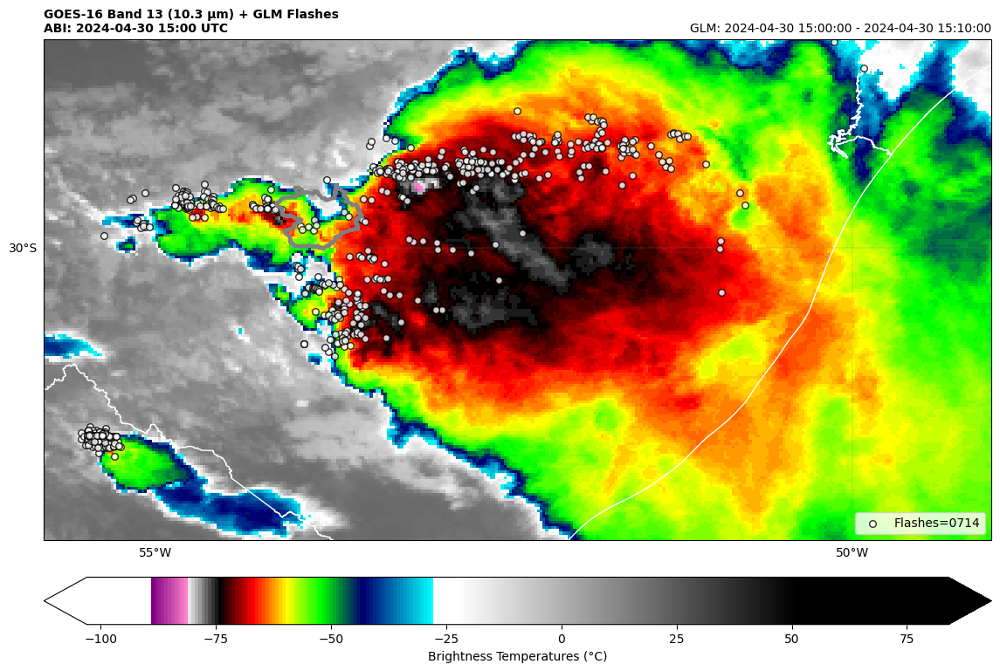

In [ ]:
#========================================================================================================================#
# CPAM Training - Satellite Applications for Nowcasting - Script 6: Temporal Evolution of IR BTs and Flashes
#========================================================================================================================#
#========================================================================================================================#
#                                            REQUIRED MODULES
#========================================================================================================================#
from netCDF4 import Dataset                      # Read / Write NetCDF4 files
import matplotlib.pyplot as plt                  # Plotting library
from matplotlib import cm                        # Colormap handling utilities
import cartopy, cartopy.crs as ccrs              # Plot maps
import cartopy.io.shapereader as shpreader       # Read shapefiles
from datetime import timedelta, datetime         # Basic Dates and time types
from utilities import download_CMI, download_GLM # Our own utilities
from utilities import loadCPT                    # Import the CPT convert function
from utilities import reproject                  # Our function for reproject
import os                                        # Miscellaneous operating system interfaces
import numpy as np                               # Scientific computing with Python
from osgeo import osr                            # Python bindings for GDAL
from osgeo import gdal                           # Python bindings for GDAL
gdal.PushErrorHandler('CPLQuietErrorHandler')    # Ignore GDAL warnings
import xarray as xr                              # Work with multidimensional arrays
import pandas as pd                              # Work with dataframes
import salem                                     # Work with shapefiles
import geopandas as gpd                          # Work with geodataframes

#========================================================================================================================#
#                                        INITIAL DEFINITIONS
#========================================================================================================================#
# Create the input and output directories
input = "/content/samples"; os.makedirs(input, exist_ok=True)
output = "/content/output"; os.makedirs(output, exist_ok=True)

# Channel
band = '13'

# Desired extent
lonmin, lonmax, latmin, latmax = -55.8, -49.0, -32.1, -28.5
extent = [lonmin, lonmax, latmin, latmax] # Min lon, Max lon, Min lat, Max lat

# Reading Santa Maria shapefile
santa_maria = salem.read_shapefile('https://github.com/evmpython/minicurso_nowcasting_CPAM2024/raw/main/shapefiles/SANTA_MARIA_MUN.shp')

#========================================================================================================================#
#                                              LOOP OF IMAGES
#========================================================================================================================#
# Variables of time evolution of temperature and flashes
temp_min_sm, temp_mean_sm, flash_total_sm, time_images = [], [], [], []

# Images Loop
for date_image in pd.date_range('202404301300', '202404301500', freq='10min'):

    #--------------------------------------------------------------------------#
    #                                DATE
    #--------------------------------------------------------------------------#
    # Datetime to process
    yyyymmddhhmn = date_image.strftime('%Y%m%d%H%M') # '202404301300'

    # Initial time and date
    yyyy = datetime.strptime(yyyymmddhhmn, '%Y%m%d%H%M').strftime('%Y')
    mm = datetime.strptime(yyyymmddhhmn, '%Y%m%d%H%M').strftime('%m')
    dd = datetime.strptime(yyyymmddhhmn, '%Y%m%d%H%M').strftime('%d')
    hh = datetime.strptime(yyyymmddhhmn, '%Y%m%d%H%M').strftime('%H')
    mn = datetime.strptime(yyyymmddhhmn, '%Y%m%d%H%M').strftime('%M')
    time_images.append(f'{hh}:{mn}')

    print('#=====================================================================================================#')
    print(f'                           PROCESSING THE IMAGE = {yyyy}-{mm}-{dd} {hh}{mn} UTC'                       )
    print('#=====================================================================================================#')

    # Download the file
    file_name = download_CMI(yyyymmddhhmn, band, input)

    #--------------------------------------------------------------------------#
    #                       REPROJECT THE DATA
    #--------------------------------------------------------------------------#
    # Variable ('CMI' - Cloud and Moisture Imagery)
    var = 'CMI'

    # Open the file
    img = gdal.Open(f'NETCDF:{input}/{file_name}.nc:' + var)

    # Read the header metadata
    metadata = img.GetMetadata()
    scale = float(metadata.get(var + '#scale_factor'))
    offset = float(metadata.get(var + '#add_offset'))
    undef = float(metadata.get(var + '#_FillValue'))
    dtime = metadata.get('NC_GLOBAL#time_coverage_start')

    # Load the data
    ds = img.ReadAsArray(0, 0, img.RasterXSize, img.RasterYSize).astype(float)

    # Apply the scale, offset and convert to celsius
    ds = (ds * scale + offset) - 273.15

    # Read the original file projection and configure the output projection
    source_prj = osr.SpatialReference()
    source_prj.ImportFromProj4(img.GetProjectionRef())

    target_prj = osr.SpatialReference()
    target_prj.ImportFromProj4("+proj=longlat +ellps=WGS84 +datum=WGS84 +no_defs")

    # Reproject the data
    GeoT = img.GetGeoTransform()
    driver = gdal.GetDriverByName('MEM')
    raw = driver.Create('raw', ds.shape[0], ds.shape[1], 1, gdal.GDT_Float32)
    raw.SetGeoTransform(GeoT)
    raw.GetRasterBand(1).WriteArray(ds)

    # Define the parameters of the output file
    options = gdal.WarpOptions(format = 'netCDF',
                               srcSRS = source_prj,
                               dstSRS = target_prj,
                               outputBounds = (extent[0], extent[3], extent[2], extent[1]),
                               outputBoundsSRS = target_prj,
                               outputType = gdal.GDT_Float32,
                               srcNodata = undef,
                               dstNodata = 'nan',
                               xRes = 0.02,
                               yRes = 0.02,
                               resampleAlg = gdal.GRA_NearestNeighbour)

    # Write the reprojected file on disk
    gdal.Warp(f'{output}/{file_name}_ret.nc', raw, options=options)

    #--------------------------------------------------------------------------#
    #                       READ THE REPROJECTED FILE
    #--------------------------------------------------------------------------#
    dataset_ir = xr.open_dataset(f'{output}/{file_name}_ret.nc').sel(lon=slice(lonmin, lonmax), lat=slice(latmax, latmin))

    #--------------------------------------------------------------------------#
    #                         GET GLM DATA
    #--------------------------------------------------------------------------#
    # Date the actual image and next image
    date_ini = str(datetime(int(yyyy),int(mm),int(dd),int(hh),int(mn)))
    date_end = str(datetime(int(yyyy),int(mm),int(dd),int(hh),int(mn)) + timedelta(minutes=10))

    # GLM accumulation loop
    lats_flash, lons_flash = np.array([]), np.array([])
    while (date_ini <= date_end):

        # Date structure
        yyyymmddhhmnss = datetime.strptime(date_ini, '%Y-%m-%d %H:%M:%S').strftime('%Y%m%d%H%M%S')

        # Download the file
        file_glm = download_GLM(yyyymmddhhmnss, input)

        # Read the file
        glm_20s = Dataset(f'{input}/{file_glm}.nc')

        # Append lats / longs
        lats_flash = np.append(lats_flash, glm_20s.variables['flash_lat'][:])
        lons_flash = np.append(lons_flash, glm_20s.variables['flash_lon'][:])

        # Increment the date_ini
        date_ini = str(datetime.strptime(date_ini, '%Y-%m-%d %H:%M:%S') + timedelta(seconds=20))
    #--------------------------------------------------------------------------#

    # Select the flashes inside the region
    # Put the flashes into dataframe
    data_flash = {'lat': lats_flash, 'lon': lons_flash}
    df = pd.DataFrame(data_flash)

    # Select the flashes from region of interest
    df_flash_filtered = df[ (df['lon'] > lonmin) & (df['lon'] < lonmax) & (df['lat'] > latmin) & (df['lat'] < latmax)]

    # Transform from dataframe to array
    lons_flash_filtered, lats_flash_filtered = df_flash_filtered['lon'].values, df_flash_filtered['lat'].values

    #--------------------------------------------------------------------------#
    #                       CREATE THE FIGURE
    #--------------------------------------------------------------------------#
    # Choose the plot size (width x height, in inches)
    plt.figure(figsize=(14,11))

    # Use the Geostationary projection in cartopy
    ax = plt.axes(projection=ccrs.PlateCarree())

    # Converts a CPT file to be used in Python
    cpt = loadCPT('IR4AVHRR6.cpt')
    cmap = cm.colors.LinearSegmentedColormap('cpt', cpt)

    # Plot the image
    img = ax.imshow(dataset_ir['Band1'], origin='upper', vmin=-103.0, vmax=84, extent=[lonmin, lonmax, latmin, latmax], cmap=cmap, alpha=1.0)

    # Plot the GLM Data
    glm = plt.scatter(lons_flash_filtered, lats_flash_filtered, transform=ccrs.PlateCarree(), marker='o', s=30, facecolor='white', edgecolor='black', linewidth=1, alpha=0.8, zorder=2,
                      label=f'Flashes={str(len(lats_flash_filtered)).zfill(4)}')

    # Add legend
    ax.legend(loc='lower right', ncols=1, facecolor='white', frameon=True)

    # Add gridlines
    gl = ax.gridlines(crs=ccrs.PlateCarree(), color='gray', alpha=1.0, linestyle='--', linewidth=0.25, xlocs=np.arange(-180, 180, 5), ylocs=np.arange(-90, 90, 5), draw_labels=True)
    gl.top_labels = False
    gl.right_labels = False

    # Plot States shapefile
    shapefile = list(shpreader.Reader('https://github.com/evmpython/minicurso_nowcasting_CPAM2024/raw/main/shapefiles/BR_UF_2019.shp').geometries())
    ax.add_geometries(shapefile, ccrs.PlateCarree(), edgecolor='white', facecolor='none', linewidth=1.0)

    # Plot Santa Maria shapefile
    shapefile = list(shpreader.Reader('https://github.com/evmpython/minicurso_nowcasting_CPAM2024/raw/main/shapefiles/SANTA_MARIA_MUN.shp').geometries())
    ax.add_geometries(shapefile, ccrs.PlateCarree(), edgecolor='gray', facecolor='none', linewidth=3.0, zorder=3)

    # Add a colorbar
    plt.colorbar(img, label='Brightness Temperatures (°C)', extend='both', orientation='horizontal', pad=0.05)

    # read the time/date from the NetCDF file metadata as a string
    date = (datetime.strptime(dtime, '%Y-%m-%dT%H:%M:%S.%fZ')).strftime('%Y-%m-%d %H:%M UTC')

    # Add a title
    plt.title(f'GOES-16 Band 13 (10.3 µm) + GLM Flashes\nABI: {date}', fontweight='bold', fontsize=10, loc='left')
    date_ini = str(datetime(int(yyyy),int(mm),int(dd),int(hh),int(mn)))
    date_end = str(datetime(int(yyyy),int(mm),int(dd),int(hh),int(mn)) + timedelta(minutes=10))
    plt.title(f'GLM: {str(date_ini)} - {str(date_end)}', fontsize="10", loc="right")

    print(date)
    print(f'GLM: {str(date_ini)} - {str(date_end)}')

    # Save the image
    plt.savefig(f'{output}/script_6a_{yyyy}-{mm}-{dd}_{hh}:{mn}_UTC.png', bbox_inches='tight', dpi=300)

    # Show the image (uncomment this to show each image)
    #plt.show()
    #--------------------------------------------------------------------------#
    #            EXTRACT THE TEMPERATURE INSIDE SANTA MARIA CITY
    #--------------------------------------------------------------------------#
    # Extract values only inside Santa Maria city
    data_ir_sm = dataset_ir['Band1'].salem.roi(shape=santa_maria)

    # Calculate the minimum and mean temperature
    temp_min, temp_mean = float(data_ir_sm.min(('lon', 'lat'))), float(data_ir_sm.mean(('lon', 'lat')))

    # Append the variables
    temp_min_sm.append(temp_min)
    temp_mean_sm.append(temp_mean)

    #--------------------------------------------------------------------------#
    #            EXTRACT THE FLASHES INSIDE SANTA MARIA CITY
    #--------------------------------------------------------------------------#
    # Read Santa Maria shapefile into GeoDataframe
    santamaria_gpd = gpd.read_file('https://github.com/evmpython/minicurso_nowcasting_CPAM2024/raw/main/shapefiles/SANTA_MARIA_MUN.shp')

    # New geodataframe
    df_flash_filtered_gpd = gpd.GeoDataFrame(df_flash_filtered.reset_index(), geometry=gpd.points_from_xy(df_flash_filtered.lon, df_flash_filtered.lat))

    # Assign coordinate system (CRS)
    df_flash_filtered_gpd.crs = santamaria_gpd.crs

    # Apply the mask
    df_flash_filtered_gpd_sm = gpd.overlay(df_flash_filtered_gpd, santamaria_gpd, how='intersection')

    # Append flashes
    flash_total_sm.append(df_flash_filtered_gpd_sm.shape[0])
    print('\n')

#--------------------------------------------------------------------------#
#               INSERT INTO DATAFRAME
#--------------------------------------------------------------------------#
data_ts = {'time': time_images,
           'temp_min_sm': temp_min_sm,
           'temp_mean_sm': temp_mean_sm,
           'flash_total_sm': flash_total_sm}

df_ts = pd.DataFrame(data_ts)

In [ ]:
# Flashes
df_flash_filtered

,lat,lon
3,-29.398468,-53.224819
4,-29.591152,-54.796509
5,-29.631451,-54.586357
10,-29.412741,-51.926964
12,-29.693024,-54.852718
...,...,...
2107,-29.715990,-54.247314
2110,-29.303276,-52.941277
2112,-29.114536,-51.786007
2114,-31.349514,-55.378292


In [ ]:
# Flashes for Santa Maria
df_flash_filtered_gpd_sm

,index,lat,lon,CD_MUN,NM_MUN,SIGLA_UF,AREA_KM2,geometry
0,202,-29.741861,-53.644131,4316907,Santa Maria,RS,1780.194,POINT (-53.64413 -29.74186)
1,218,-29.843636,-53.958363,4316907,Santa Maria,RS,1780.194,POINT (-53.95836 -29.84364)
2,340,-29.776642,-53.610931,4316907,Santa Maria,RS,1780.194,POINT (-53.61093 -29.77664)
3,458,-29.868670,-53.947887,4316907,Santa Maria,RS,1780.194,POINT (-53.94789 -29.86867)
4,724,-29.798828,-53.857006,4316907,Santa Maria,RS,1780.194,POINT (-53.85701 -29.79883)
5,908,-29.848053,-53.904900,4316907,Santa Maria,RS,1780.194,POINT (-53.90490 -29.84805)
6,1328,-29.872536,-53.866665,4316907,Santa Maria,RS,1780.194,POINT (-53.86666 -29.87254)
7,1789,-29.839367,-53.843948,4316907,Santa Maria,RS,1780.194,POINT (-53.84395 -29.83937)


In [ ]:
# Number flashes before and after apply filter
print(df_flash_filtered.shape[0], df_flash_filtered_gpd_sm.shape[0])

714 8


In [ ]:
# Showing the dataframe with temperature and flashes
df_ts

,time,temp_min_sm,temp_mean_sm,flash_total_sm
0,13:00,-79.673889,-57.416218,40
1,13:10,-75.925232,-58.616138,27
2,13:20,-75.372154,-58.718452,32
3,13:30,-82.009109,-61.044365,42
4,13:40,-79.182259,-67.655785,58
5,13:50,-81.701843,-70.486244,102
6,14:00,-81.210220,-67.512596,111
7,14:10,-83.668350,-64.129944,84
8,14:20,-79.182259,-60.775261,63
9,14:30,-74.265991,-55.465637,59


## **Animação das imagens**

<ipython-input-13-812b745e33cb>:11: DeprecationWarning: Starting with ImageIO v3 the behavior of this function will switch to that of iio.v3.imread. To keep the current behavior (and make this warning disappear) use `import imageio.v2 as imageio` or call `imageio.v2.imread` directly.
  images.append(imageio.imread(file))



Abrindo o GIF..



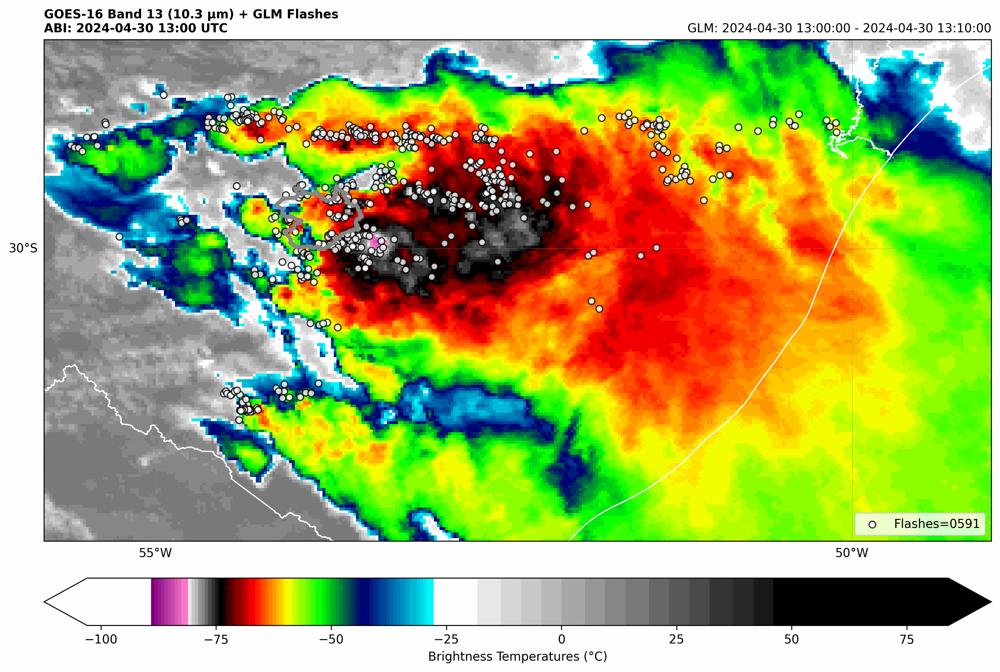

In [ ]:
# Import library
import imageio # Make animations
import glob    # To list files

# List the images for animation
files = sorted(glob.glob('/content/output/script_6a*png'))

# Make the animation
images = []
for file in files:
    images.append(imageio.imread(file))

# Salve the animation
imageio.mimsave('/content/output/script_6b_animacao.gif',
                images,
                duration=700,
                loop=0)

# Show the animation
print("\nAbrindo o GIF..\n")
from IPython.display import Image
Image(open(f'/content/output/script_6b_animacao.gif','rb').read(), width=600)

##**Evolução Temporal**

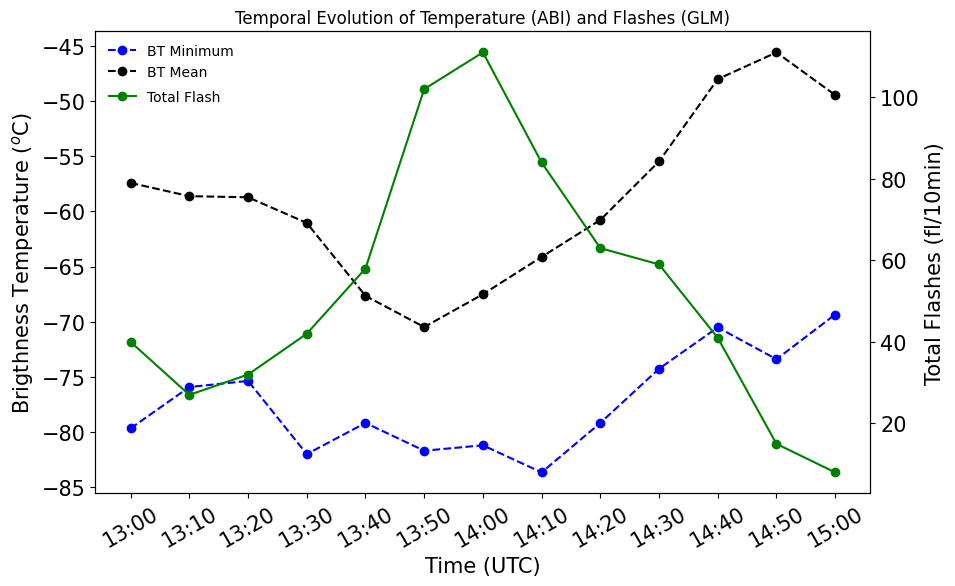

In [ ]:
#==================================================================================#
#                       INITIAL CONFIGURATION
#==================================================================================#
# Import library
import matplotlib.pyplot as plt

# Size of figure
fig, ax1 = plt.subplots(figsize=(10, 6))

#==================================================================================#
#             PLOT-1: plotting temperature on the primary y-axis (ax1)
#==================================================================================#
# Plot figure
ax1.plot(df_ts['time'].values, df_ts['temp_min_sm'].values, marker='o', color='blue', linestyle='--', label='BT Minimum')
ax1.plot(df_ts['time'].values, df_ts['temp_mean_sm'].values, marker='o', color='black', linestyle='--', label='BT Mean')

# X and Y-axis names
ax1.set_xlabel('Time (UTC)', color='black', size=15)
ax1.set_ylabel('Brigthness Temperature ($^o$C)', color='black', size=15)

# X and Y-axis configuration
ax1.tick_params(axis='x', labelcolor='black', labelsize=15, rotation=30)
ax1.tick_params(axis='y', labelcolor='black', labelsize=15)

# Add legend
ax1.legend(loc='upper left', frameon=False)

#==================================================================================#
#             PLOT-2: plotting flash on the secundary y-axis (ax2)
#==================================================================================#
# Add additional y-axis
ax2 = ax1.twinx()

# Plot figure
ax2.plot(df_ts['time'].values, df_ts['flash_total_sm'].values, marker='o', color='green', label='Total Flash')

# Y-axis name
ax2.set_ylabel('Total Flashes (fl/10min)', color='black', size=15)

# Y-axis configuration
ax2.tick_params(axis='y', labelcolor='black', labelsize=15)

# Add legend
ax2.legend(bbox_to_anchor=(0.178, 0.90), frameon=False)

# Add title for figure
plt.title(f'Temporal Evolution of Temperature (ABI) and Flashes (GLM)')

#==================================================================================#
#                     SALVE AND SHOW THE FIGURE
#==================================================================================#
# Save the image
plt.savefig(f'{output}/script_6c_temporal_evolution.png', bbox_inches='tight', dpi=300)

# Show the figure
plt.show()